# 🤖 LLM 원리 + OpenAI Chat Completion API 활용

---

## 1. LLM 기본 개념

### 🧠 LLM(Large Language Model)의 생성 원리

**LLM은 어떻게 작동하나요?**
- **트랜스포머 구조**: 대화형 AI의 핵심 아키텍처
- **토큰 예측**: 다음에 올 가장 적절한 단어를 예측
- **학습 방식**: 인터넷의 방대한 텍스트 데이터로 사전 훈련

**핵심 프로세스**
1. **토큰화**: 텍스트를 작은 단위(토큰)로 분할
2. **확률 계산**: 각 토큰이 다음에 올 확률 계산
3. **토큰 생성**: 확률 분포에 따라 토큰 선택
4. **반복**: 종료 조건까지 과정 반복


**트랜스포머**:
- **인코더-디코더 구조**: 입력과 출력을 동시에 처리
- **어텐션 메커니즘**: 입력의 모든 부분을 동시에 고려하여 중요한 정보에 집중


<div style="text-align: left; font-size: 12px;">
<div style="text-align: center;">
    <img src="https://upload.wikimedia.org/wikipedia/commons/thumb/3/34/Transformer%2C_full_architecture.png/440px-Transformer%2C_full_architecture.png"
        alt="Illustrations for the Transformer and attention mechanism showing the full Transformer architecture"
        width="600"
        style="border: 0;">
</div>

**Image Title:** Transformer Architecture Illustration  
**Source:** [GitHub - DL Visuals](https://github.com/dvgodoy/dl-visuals/?tab=readme-ov-file)  
**License:** [Creative Commons Attribution 4.0 International License](https://creativecommons.org/licenses/by/4.0/)  
**Author(s):** dvgodoy  

</div>




---

## 2. OpenAI API 핵심 개념

### 🔧 주요 구성 요소

**1. 메시지 형식**

  ```python
  messages = [
      {"role": "system", "content": "당신은 도움이 되는 AI 어시스턴트입니다."},
      {"role": "user", "content": "파이썬에서 리스트를 정렬하는 방법을 알려주세요."},
      {"role": "assistant", "content": "sort() 메서드나 sorted() 함수를 사용할 수 있습니다."}
  ]
  ```

**2. 현재 사용 가능한 주요 모델 (2025년 기준)**

  - **gpt-4.1**: 최고 성능, 복잡한 작업용
  - **gpt-4.1-mini**: 빠른 속도, 비용 효율적
  - **gpt-4.1-nano**: 초고속, 최저 비용
  - **o3, o4-mini**: 복잡한 추론 작업용
  - **gpt-4o**: 멀티모달 (텍스트, 이미지, 오디오)

**3. API 응답 구조**

  ```json
  {
    "id": "chatcmpl-...",
    "object": "chat.completion",
    "model": "gpt-4.1-mini",
    "choices": [
      {
        "message": {
          "role": "assistant", 
          "content": "생성된 텍스트"
        }
      }
    ],
    "usage": {
      "prompt_tokens": 10,
      "completion_tokens": 50,
      "total_tokens": 60
    }
  }
  ```


---

## 3. 환경 설정


### 🚀 uv 프로젝트 설정
- **프로젝트 생성**: `uv init [프로젝트명]`
- **가상환경 생성**: `uv venv --python=3.12`
- **가상환경 활성화**: `.venv/bin/activate` (Unix) 또는 `.venv\Scripts\activate` (Windows)


### 📦 패키지 설치
```bash
# uv 사용 (권장)
uv add langchain langchain_openai python-dotenv ipykernel

# pip 사용
pip install langchain langchain_openai python-dotenv ipykernel
```

### 🔐 API 키 설정
```python
# .env 파일 생성
OPENAI_API_KEY=your_api_key_here

# Python에서 로드
from dotenv import load_dotenv
import os

load_dotenv()
OPENAI_API_KEY = os.getenv("OPENAI_API_KEY")
```



---

## 4. 기본 사용법

### 텍스트 답변을 생성

* OpenAI 클라이언트 설정
  - `from openai import OpenAI`로 OpenAI 패키지를 임포트합니다
  - `client = OpenAI()`로 API 클라이언트를 생성합니다
  - API 키는 환경변수나 직접 설정을 통해 제공할 수 있습니다
  - 보안을 위해 API 키는 `.env` 파일이나 환경변수를 통해 관리하는 것이 권장됩니다

* Chat Completion 요청 구조
  - `client.chat.completions.create()`를 통해 텍스트 생성을 요청합니다
  - `model`: 사용할 모델을 지정 (예: "gpt-4-mini")
  - `messages`: 대화 맥락을 리스트 형태로 전달
    - `role`: "developer", "user" 등의 역할 지정
    - `content`: 실제 메시지 내용
  - `temperature`: 생성 텍스트의 무작위성 조절 (0~1)
  - `max_tokens`: 생성될 최대 토큰 수 제한

* 응답 처리
  - API는 JSON 형태로 응답을 반환합니다
  - `response.choices[0].message.content`: 생성된 분석 텍스트
  - `response.usage`: 토큰 사용량 정보
  - `response.id`: 응답의 고유 식별자
  - `response.model`: 사용된 모델 정보


In [1]:
# OpenAI API를 직접 사용하는 방법
from openai import OpenAI

# 통신을 위한 클라이언트 생성 (.env 파일을 사용하지 않는 경우에는 주석을 해제하고 api_key를 직접 입력)
client = OpenAI(
    # api_key = OPENAI_API_KEY,
)

# Completion 요청 (prompt -> completion)
response = client.chat.completions.create(
    model="gpt-4.1-mini",
    messages=[
        # developer 역할 - 전반적인 동작 방식 정의
        {"role": "developer", "content": "You are a helpful programming assistant."},
        # user 역할 - 실제 요청 내용
        {"role": "user", "content": "파이썬에서 파일을 읽는 방법을 알려주세요."},
    ],
    temperature=0.7,
    max_tokens=1000,
)

# 결과 출력
print(response)
print("="*100)
print("id:", response.id)
print("-"*100)
print('model:', response.model)
print("-"*100)
print("text:", response.choices[0].message.content)
print("-"*100)
print("usage:", response.usage)

ChatCompletion(id='chatcmpl-C9UXAB896UXk7EKZwkz02jEbZz0Jl', choices=[Choice(finish_reason='stop', index=0, logprobs=None, message=ChatCompletionMessage(content="파이썬에서 파일을 읽는 방법은 여러 가지가 있지만, 가장 기본적이고 많이 사용하는 방법은 `open()` 함수를 사용하여 파일을 열고, 읽기 모드(`'r'`)로 읽는 것입니다. 아래에 몇 가지 예시를 보여드릴게요.\n\n---\n\n### 1. 전체 내용을 한 번에 읽기\n\n```python\nwith open('파일이름.txt', 'r', encoding='utf-8') as file:\n    content = file.read()\n    print(content)\n```\n\n- `with` 구문을 사용하면 파일을 자동으로 닫아주기 때문에 안전합니다.\n- `'r'`은 읽기 모드(read mode)를 의미합니다.\n- `encoding='utf-8'`은 파일 인코딩을 지정해 줍니다. (한글 등 문자 인코딩 문제 방지)\n\n---\n\n### 2. 한 줄씩 읽기\n\n```python\nwith open('파일이름.txt', 'r', encoding='utf-8') as file:\n    for line in file:\n        print(line.strip())  # strip()은 줄 끝의 개행문자를 제거합니다.\n```\n\n---\n\n### 3. 리스트로 읽기 (모든 줄을 리스트의 요소로)\n\n```python\nwith open('파일이름.txt', 'r', encoding='utf-8') as file:\n    lines = file.readlines()\n    print(lines)  # 각 줄이 요소로 들어있는 리스트\n```\n\n---\n\n필요한 부분에 맞게 사용하시면 됩니다. 궁금한 점 있으면 추가로 질문해 주세요!", refus

In [2]:
# 결과 출력 (Markdown)
from IPython.display import Markdown, display

display(Markdown(response.choices[0].message.content))

파이썬에서 파일을 읽는 방법은 여러 가지가 있지만, 가장 기본적이고 많이 사용하는 방법은 `open()` 함수를 사용하여 파일을 열고, 읽기 모드(`'r'`)로 읽는 것입니다. 아래에 몇 가지 예시를 보여드릴게요.

---

### 1. 전체 내용을 한 번에 읽기

```python
with open('파일이름.txt', 'r', encoding='utf-8') as file:
    content = file.read()
    print(content)
```

- `with` 구문을 사용하면 파일을 자동으로 닫아주기 때문에 안전합니다.
- `'r'`은 읽기 모드(read mode)를 의미합니다.
- `encoding='utf-8'`은 파일 인코딩을 지정해 줍니다. (한글 등 문자 인코딩 문제 방지)

---

### 2. 한 줄씩 읽기

```python
with open('파일이름.txt', 'r', encoding='utf-8') as file:
    for line in file:
        print(line.strip())  # strip()은 줄 끝의 개행문자를 제거합니다.
```

---

### 3. 리스트로 읽기 (모든 줄을 리스트의 요소로)

```python
with open('파일이름.txt', 'r', encoding='utf-8') as file:
    lines = file.readlines()
    print(lines)  # 각 줄이 요소로 들어있는 리스트
```

---

필요한 부분에 맞게 사용하시면 됩니다. 궁금한 점 있으면 추가로 질문해 주세요!

---

### 구조화된 JSON 출력

구조화된 출력은 데이터 처리와 분석에 용이하며, API 응답의 일관성을 보장합니다.

* JSON Schema 정의
  - `response_format`을 통해 응답의 형식을 JSON으로 지정합니다
  - `json_schema`에서 데이터 구조와 각 필드의 특성을 정의합니다
    - `type`: 데이터 타입 (string, number 등)
    - `description`: 각 필드에 대한 설명
    - `required`: 필수 필드 지정
    - `additionalProperties`: 추가 속성 허용 여부

* 정보 추출 과정
  - 입력된 텍스트에서 정규화된 형태로 정보를 추출
  - 지정된 스키마에 맞춰 JSON 객체 구성
  - 필수 필드가 누락되지 않도록 검증
  - 가격과 같은 숫자 정보는 적절한 형식으로 변환

In [3]:
from openai import OpenAI
client = OpenAI()

response = client.chat.completions.create(
    model="gpt-4.1",
    messages=[
        {
            "role": "developer",
            "content": "상품 정보를 구조화된 형태로 추출하고, 각 속성에 대해 자세히 설명합니다."
        },
        {
            "role": "user",
            "content": "애플 아이폰 15 프로 256GB (블랙) - 1,500,000원"
        }
    ],
    response_format={
        "type": "json_schema",
        "json_schema": {
            "name": "product_schema",
            "description": "상품의 상세 정보를 구조화하기 위한 스키마",
            "schema": {
                "type": "object",
                "properties": {
                    "brand": {
                        "type": "string",
                        "description": "제조사 또는 브랜드 이름 (예: 애플, 삼성, LG 등)"
                    },
                    "model": {
                        "type": "string",
                        "description": "제품의 모델명 또는 시리즈명"
                    },
                    "capacity": {
                        "type": "string",
                        "description": "저장 용량 또는 규격 (예: 256GB, 512GB 등)"
                    },
                    "color": {
                        "type": "string",
                        "description": "제품의 색상"
                    },
                    "price": {
                        "type": "number",
                        "description": "제품의 가격 (단위: 원)",
                        "minimum": 0
                    },
                    "category": {
                        "type": "string",
                        "description": "제품의 카테고리 (예: 스마트폰, 노트북 등)"
                    },
                },
                "required": ["brand", "model", "price"],
                "additionalProperties": False
            }
        }
    }
)

# 결과 출력
print(response)
print("="*100)
print("id:", response.id)
print("-"*100)
print('model:', response.model)
print("-"*100)
print("text:", response.choices[0].message.content)
print("-"*100)
print("usage:", response.usage)

ChatCompletion(id='chatcmpl-C9UYBHp7JDtvhuMtGYcS68YKBUcfq', choices=[Choice(finish_reason='stop', index=0, logprobs=None, message=ChatCompletionMessage(content='{"brand":"애플","model":"아이폰 15 프로","capacity":"256GB","color":"블랙","price":1500000,"category":"스마트폰"}', refusal=None, role='assistant', annotations=[], audio=None, function_call=None, tool_calls=None))], created=1756378423, model='gpt-4.1-2025-04-14', object='chat.completion', service_tier='default', system_fingerprint='fp_daf5fcc80a', usage=CompletionUsage(completion_tokens=36, prompt_tokens=404, total_tokens=440, completion_tokens_details=CompletionTokensDetails(accepted_prediction_tokens=0, audio_tokens=0, reasoning_tokens=0, rejected_prediction_tokens=0), prompt_tokens_details=PromptTokensDetails(audio_tokens=0, cached_tokens=0)))
id: chatcmpl-C9UYBHp7JDtvhuMtGYcS68YKBUcfq
----------------------------------------------------------------------------------------------------
model: gpt-4.1-2025-04-14
---------------------------

In [4]:
import json

data = json.loads(response.choices[0].message.content)
data

{'brand': '애플',
 'model': '아이폰 15 프로',
 'capacity': '256GB',
 'color': '블랙',
 'price': 1500000,
 'category': '스마트폰'}

---

### 이미지 분석 (멀티모달)

OpenAI API를 사용한 이미지 분석(멀티모달 기능을 통해 이미지에 대한 상세 분석과 설명을 자연어로 얻을 수 있습니다.


* 이미지 입력 방식
  - URL 방식
    - 웹상의 이미지 URL을 직접 전달
    - `image_url` 파라미터를 통해 이미지 URL 지정
    - 인터넷 접근이 가능한 이미지에 대해 사용
  
  - Base64 인코딩 방식
    - 로컬 이미지 파일을 Base64 문자열로 변환
    - `encode_image()` 함수로 이미지 파일을 Base64로 인코딩
    - 인코딩된 문자열을 `data:image/jpeg;base64,` 형식으로 전달
    - 로컬 이미지나 비공개 이미지 처리에 적합

* API 요청 구조
  - `messages` 배열에 멀티모달 컨텐츠 포함
    - `type`: "text" 또는 "image_url"로 컨텐츠 유형 구분
    - 텍스트와 이미지를 함께 전달 가능
    - `role`을 통해 개발자/사용자 역할 지정


`(1) 이미지 URL 사용`

- uv add pillow

이미지 크기: (2560, 1669)
이미지 모드: RGB
이미지 포맷: JPEG


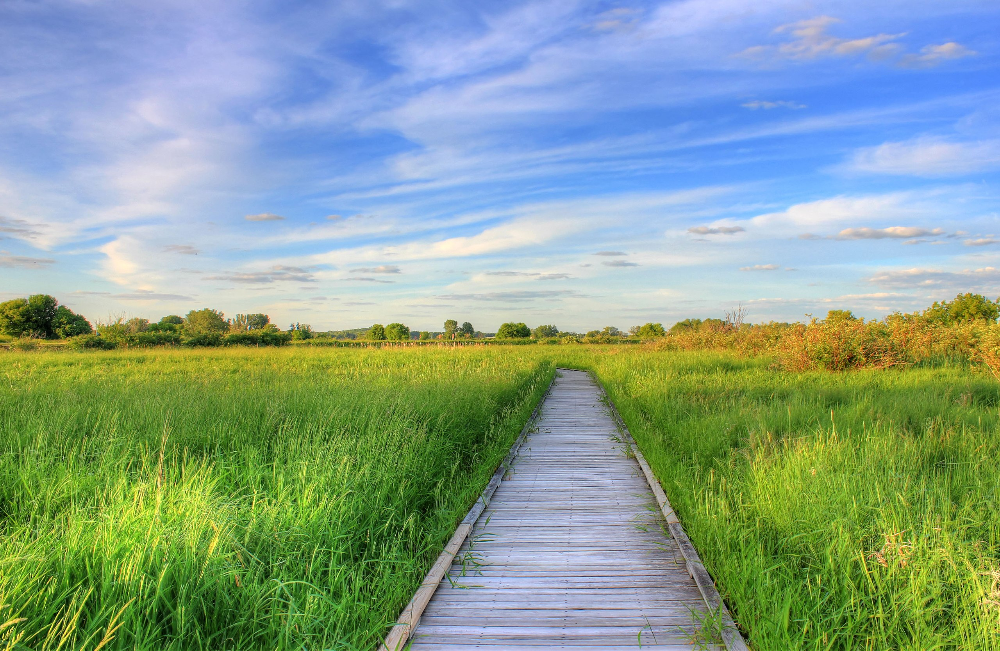

이미지 다운로드 및 표시 완료!


In [5]:
import httpx
import asyncio
from PIL import Image
from io import BytesIO

async def download_and_display_image(image_url):
    """이미지를 비동기로 다운로드하고 표시하는 함수"""
    
    async with httpx.AsyncClient() as client:
        # 비동기로 이미지 다운로드
        response = await client.get(image_url)
        
        # 응답 상태 확인
        response.raise_for_status()
        
        # 이미지 열기
        img = Image.open(BytesIO(response.content))
        
        # 이미지 정보 출력
        print(f"이미지 크기: {img.size}")
        print(f"이미지 모드: {img.mode}")
        print(f"이미지 포맷: {img.format}")
        
        # 이미지 출력
        display(img)
        
        return img

# 이미지 URL
image_url = "https://upload.wikimedia.org/wikipedia/commons/thumb/d/dd/Gfp-wisconsin-madison-the-nature-boardwalk.jpg/2560px-Gfp-wisconsin-madison-the-nature-boardwalk.jpg"

try:
    img = await download_and_display_image(image_url)
    print("이미지 다운로드 및 표시 완료!")
except httpx.HTTPError as e:
    print(f"HTTP 에러 발생: {e}")
except Exception as e:
    print(f"일반 에러 발생: {e}")

In [6]:
from openai import OpenAI

client = OpenAI()

response = client.chat.completions.create(
    model="gpt-4.1-mini",
    messages=[
        {
            "role": "user",
            "content": [
                {
                    "type": "text",
                    "text": "What's in this image? Answer in 한국어."},
                {
                    "type": "image_url",
                    "image_url": {
                        "url": image_url,
                    }
                },
            ],
        }
    ],
)

# 결과 출력
print(response)
print("="*100)
print("id:", response.id)
print("-"*100)
print('model:', response.model)
print("-"*100)
print("text:", response.choices[0].message.content)
print("-"*100)
print("usage:", response.usage)

ChatCompletion(id='chatcmpl-C9UYaerbaWd0Dtg0c3BOzjYbGGBT3', choices=[Choice(finish_reason='stop', index=0, logprobs=None, message=ChatCompletionMessage(content='이 이미지는 푸른 하늘과 구름이 보이는 넓은 초원 또는 풀밭 가운데 나무로 만든 산책로가 있는 풍경입니다. 산책로를 따라 양쪽에는 키 큰 풀과 나무들이 있으며, 자연의 평화롭고 아름다운 모습을 담고 있습니다.', refusal=None, role='assistant', annotations=[], audio=None, function_call=None, tool_calls=None))], created=1756378448, model='gpt-4.1-mini-2025-04-14', object='chat.completion', service_tier='default', system_fingerprint='fp_37c45ea698', usage=CompletionUsage(completion_tokens=67, prompt_tokens=2429, total_tokens=2496, completion_tokens_details=CompletionTokensDetails(accepted_prediction_tokens=0, audio_tokens=0, reasoning_tokens=0, rejected_prediction_tokens=0), prompt_tokens_details=PromptTokensDetails(audio_tokens=0, cached_tokens=0)))
id: chatcmpl-C9UYaerbaWd0Dtg0c3BOzjYbGGBT3
----------------------------------------------------------------------------------------------------
model: gpt-4.1-mini-2025-04-14

`(2)  Base 64 encoded format 사용`

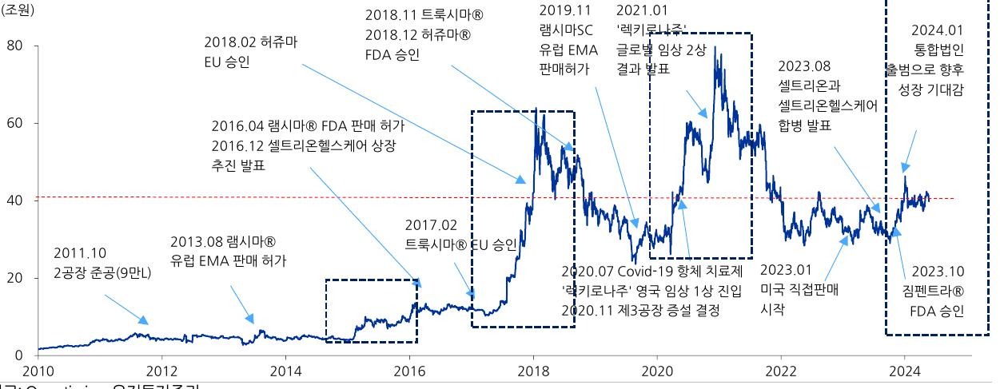

In [7]:
# 로컬 이미지 파일 경로
image_path = "data/celltrion_report_chart.jpg"

# 이미지 출력
img = Image.open(image_path)
display(img)

In [8]:
import base64
from openai import OpenAI

client = OpenAI()

# 이미지를 base64로 인코딩하는 함수
def encode_image(image_path):
    with open(image_path, "rb") as image_file:
        return base64.b64encode(image_file.read()).decode("utf-8")

# 이미지를 base64 포맷 문자열로 변환
base64_image = encode_image(image_path)

response = client.chat.completions.create(
    model="gpt-4.1-mini",
    messages=[
        {
            "role": "developer",
            "content": [
                {
                    "type": "text",
                    "text": """You are a financial chart analyst. For any chart:
                            1. Identify the financial metrics being displayed
                            2. Note key price levels, support/resistance areas
                            3. Identify significant trends and pattern formations
                            4. Calculate relevant indicators (if visible)
                            5. Highlight trading volume patterns
                            6. Point out any significant market events
                            7. Provide technical analysis insights
                            Be specific with price levels and dates. Answer in 한국어."""
                }
            ]
        },
        {
            "role": "user",
            "content": [
                {
                    "type": "text",
                    "text": "What does this chart show?"
                },
                {
                    "type": "image_url",
                    "image_url": {
                        "url": f"data:image/jpeg;base64,{base64_image}"
                    }
                }
            ]
        }
    ]
)

print(response.choices[0])

Choice(finish_reason='stop', index=0, logprobs=None, message=ChatCompletionMessage(content='이 차트는 특정 기업의 **매출액(조원 단위)** 변화를 2010년부터 2024년까지 시간에 따라 나타낸 그래프입니다. \n\n### 1. 재무 지표\n- **세로축(Y축)**: 매출액(조원)\n- **가로축(X축)**: 연도(2010년~2024년)\n\n### 2. 주요 가격 수준 및 변동\n- 매출액이 0조원에서 시작해 40조원 중반까지 변동\n- 2018년 말부터 2019년 초, 2021년 초에 매출이 급격히 증가하는 구간이 보임\n- 여러 차례 매출 상승 및 하락 반복\n\n### 3. 주요 트렌드 및 패턴\n- 2016년 초부터 2018년 말까지 급격한 매출 증가 구간 (2016년 FDA 판매허가, 2017년 EU 승인 등의 이벤트와 일치)\n- 2018년 말부터 2019년 초에 큰 변동성 구간\n- 2020년 코로나19 치료제와 관련된 임상 진전 및 증설 결정 이후 매출이 다시 상승\n- 2023년 일부 하락 이후 다시 상승 모멘텀 확보\n\n### 4. 기술적 지표 (차트 내 포함된 정보)\n- 주석으로 각 시점별 주요 **허가, 승인, 임상 결과 발표, 생산 시설 확대, 사업 합병 및 판매 시작** 등이 표시됨\n- 예를 들어,\n  - 2016.04 램시마® FDA 판매 허가\n  - 2018.12 허쥬마® FDA 승인\n  - 2020.07 렉키로나주 영국 임상 1상 진입\n  - 2023.10 짐펜트라® FDA 승인\n\n### 5. 거래량 패턴\n- 거래량 표시는 없으나, 매출 변동폭 및 이벤트 시기와 매출 급증 밀접 관련\n\n### 6. 주요 시장 이벤트\n- EU, FDA 승인 이벤트가 매출 급증에 직접적 영향\n- Covid-19 관련 치료제 개발 및 임상 이벤트, 생산 증설 결정\n- 2023년 셀트리온과 셀트리온헬스케어 합병 발표\n\n### 7. 기술적 분석 통찰\

In [ ]:
print(response.choices[0].message.content)

---

### 오디오 출력


OpenAI API의 음성 생성(Text-to-Speech) 기능을 통해 텍스트 응답을 자연스러운 음성으로 변환하여 활용할 수 있습니다.

* API 요청 설정
  - `model`: "gpt-4.1-mini-audio-preview"와 같은 오디오 지원 모델 사용
  - `modalities`: ["text", "audio"]로 텍스트와 오디오 모두 출력
  - `audio` 파라미터 설정
    - `voice`: 음성 종류 선택 (예: "alloy")
    - `format`: 출력 포맷 지정 (예: "wav")

* 음성 생성 과정
  - API는 텍스트 응답과 함께 Base64로 인코딩된 오디오 데이터 반환
  - 응답 구조:
    - `completion.choices[0].message.content`: 텍스트 응답
    - `completion.choices[0].message.audio.data`: Base64 인코딩된 오디오 데이터

* 오디오 파일 저장
  - Base64 디코딩
    ```python
        wav_bytes = base64.b64decode(completion.choices[0].message.audio.data)
    ```
  - 파일로 저장
    ```python
        with open("sample.wav", "wb") as f:
            f.write(wav_bytes)
    ```

In [9]:
from openai import OpenAI

client = OpenAI()

completion = client.chat.completions.create(
    model="gpt-4o-mini-audio-preview",
    modalities=["text", "audio"],
    audio={"voice": "alloy", "format": "wav"},
    messages=[
        {
            "role": "user",
            "content": "안녕하세요. 대한민국의 수도는 어디인가요?"
        }
    ]
)

print(completion.choices[0])

Choice(finish_reason='stop', index=0, logprobs=None, message=ChatCompletionMessage(content=None, refusal=None, role='assistant', annotations=[], audio=ChatCompletionAudio(id='audio_68b0357e60c88191a0665b2504bafbf9', data='UklGRv////9XQVZFZm10IBAAAAABAAEAwF0AAIC7AAACABAAZGF0Yf/////3//r/9//6//z/+f8AAPv//v/8//r//f/z/wEA9v8LAPn/CQDz//3/+//4/wMA8/8IAPX/CAD2/wcA9P8DAPr//v////b/BADw/woA9f8GAPT/BQD4//7//P/y//r/9v////X/AgD1//n//P/1//3/9v/+//f//P/2//b/AAD2//3/9P/8//D/9P/5//z/+//0//r/8P/+/+7//v/z//7/9f/3//v/7P/+/+j/BQDw/wUA9f/5//v/9v8GAPH/AgDt/wAA7f/9//f/+//8//b//f/6/wMA+P8AAPf/AQD//wMA/f/6//z/+f/6//7/+f/9//n//v/8//n//f/1////8v8BAPT//f/1//n/8//v//r/5////+3//v/o//r/7P/x//X/7//y/+L//P/g//j/5f/4/+T/9f/p/+3/9//k//j/5f/4/+T/8f/w/+v/9f/m//v/6//0//H/8f/5/+v//f/y//j//P/w////5P8JAOr//v/0//X/AwDy/wwA8v8LAPX/BQDz/wEA+f/8/wMA//8HAP3/BAD3/wgA+f8JAPr/CwD+/wQAAwAIAAcAAwALAPr/CAAGABkA/v8WAPv/CwAIABIAAwAOAA8AAgAXAAQAFAD9/xUADAAOABUACgAcAAcAGgANABoAFwAVABcAFQAuABsAJgAPACEAGAAkACgAGwAyABAAMwAPADEAFgAhACUAEQA4ABMANA

In [10]:
# 음성 파일 저장
import base64

wav_bytes = base64.b64decode(completion.choices[0].message.audio.data)
with open("sample.wav", "wb") as f:
    f.write(wav_bytes)

In [11]:
# 토큰 사용량
print(response.usage)

CompletionUsage(completion_tokens=703, prompt_tokens=1156, total_tokens=1859, completion_tokens_details=CompletionTokensDetails(accepted_prediction_tokens=0, audio_tokens=0, reasoning_tokens=0, rejected_prediction_tokens=0), prompt_tokens_details=PromptTokensDetails(audio_tokens=0, cached_tokens=0))


---


**[실습 1]**: OpenAI 클라이언트를 초기화하고 환경변수에서 API 키를 가져오도록 코드를 작성하세요.
- `힌트: python-dotenv 패키지를 사용하세요.`


In [13]:
# ...existing code...
from dotenv import load_dotenv
import os
from openai import OpenAI

load_dotenv()  # .env 파일에서 환경변수 로드
OPENAI_API_KEY = os.getenv("OPENAI_API_KEY")

if not OPENAI_API_KEY:
    raise EnvironmentError("OPENAI_API_KEY not found. 추가: .env 파일에 OPENAI_API_KEY=your_key 를 설정하세요.")

client = OpenAI(api_key=OPENAI_API_KEY)
#

**[실습 2]**: 주어진 프롬프트에 대해 OpenAI API(gpt-4.1-mini)로 응답을 생성하는 함수를 작성하세요.

In [14]:
# ...existing code...
from openai import OpenAI

def get_simple_completion(prompt: str) -> str:
    # reuse global client if available (loaded from .env in earlier cell), otherwise create a new client
    if 'client' in globals() and globals()['client'] is not None:
        client = globals()['client']
    else:
        client = OpenAI()

    try:
        response = client.chat.completions.create(
            model="gpt-4.1-mini",
            messages=[{"role": "user", "content": prompt}],
            temperature=0.7,
            max_tokens=200,
        )
        return response.choices[0].message.content
    except Exception as e:
        return f"Error: {e}"
# ...existing

# 테스트 코드
print(get_simple_completion("What is the capital of the United States?"))

The capital of the United States is Washington, D.C.


---

## 5. 매개변수 최적화

### ⚙️ 핵심 매개변수 가이드

| 매개변수 | 범위 | 용도 | 추천값 |
|---------|------|------|--------|
| `temperature` | 0~2 | 창의성 조절 | 0.3 (정확성), 0.7 (균형), 1.2 (창의성) |
| `top_p` | 0~1 | 응답 다양성 | 0.9 (기본), 0.3 (집중적) |
| `max_tokens` | 1~8192+ | 최대 길이 | 작업에 따라 조절 |
| `frequency_penalty` | -2~2 | 반복 억제 | 0.3~0.6 |
| `presence_penalty` | -2~2 | 새 주제 도입 | 0.3~0.6 |

### 🎨 시나리오별 설정


**1. 정확한 정보 제공**

In [15]:
response = client.chat.completions.create(
    model="gpt-4.1-mini",
    messages=[{"role": "user", "content": "파이썬 딕셔너리 메서드들을 설명해주세요."}],
    temperature=0.2,  # 낮은 창의성
    top_p=0.3,        # 집중적 응답
    max_tokens=500
)

print(response.choices[0].message.content)

파이썬 딕셔너리(dictionary)는 키(key)와 값(value)의 쌍으로 데이터를 저장하는 자료구조입니다. 딕셔너리에서 자주 사용하는 메서드들을 설명드리겠습니다.

---

### 1. `dict.get(key, default=None)`
- **설명**: 딕셔너리에서 `key`에 해당하는 값을 반환합니다. 만약 `key`가 없으면 `default` 값을 반환합니다. `default`를 지정하지 않으면 `None`을 반환합니다.
- **예시**:
  ```python
  d = {'a': 1, 'b': 2}
  print(d.get('a'))        # 출력: 1
  print(d.get('c', 0))     # 출력: 0
  ```

---

### 2. `dict.keys()`
- **설명**: 딕셔너리의 모든 키를 반환합니다. 반환값은 `dict_keys` 객체로, 리스트처럼 반복(iterate)할 수 있습니다.
- **예시**:
  ```python
  d = {'a': 1, 'b': 2}
  print(d.keys())          # 출력: dict_keys(['a', 'b'])
  ```

---

### 3. `dict.values()`
- **설명**: 딕셔너리의 모든 값을 반환합니다. 반환값은 `dict_values` 객체입니다.
- **예시**:
  ```python
  d = {'a': 1, 'b': 2}
  print(d.values())        # 출력: dict_values([1, 2])
  ```

---

### 4. `dict.items()`
- **설명**: 딕셔너리의 (키, 값) 쌍을 튜플 형태로 반환합니다. 반환값은 `dict_items` 객체입니다.
- **예시**:
  ```python
  d = {'a': 1, 'b': 2}
  print(d.items())         # 출력: dict_items([('a', 1), ('b', 2)])
  ```

---

### 5. `dict.update

**2. 창의적 글쓰기**

In [16]:
response = client.chat.completions.create(
    model="gpt-4.1",
    messages=[{"role": "user", "content": "우주 정거장에서의 하루를 소설로 써주세요."}],
    temperature=1.1,  # 높은 창의성
    top_p=0.9,        # 다양한 표현
    max_tokens=1000,
    frequency_penalty=0.5  # 반복 방지
)

print(response.choices[0].message.content)

물론입니다! 아래는 우주 정거장에서 보내는 하루를 그린 짧은 소설입니다.

---

### 별 사이의 하루

아침 6시, 진동하는 경보음이 캡슐을 가득 채웠다. 창밖으로 보이는 푸른 지구가 이미 열두 바퀴쯤 돌았다는 신호였다. 나는 몸을 밀어올리듯 천천히 눈을 떴다. 이곳, 국제우주정거장(ISS)에서는 중력이 없다. 침낭은 내 몸을 조심스럽게 감싸고, 천장에 달린 작은 갈고리에 나를 붙잡아둔다.

김박사와 왕 선임이 조용히 조명 스위치를 켰다. 빛이 뿌옇게 번진다. "잘 잤어요?" 김박사가 속삭인다. 마치 도서관에서 대화하는 것처럼, 우리는 습관적으로 목소리를 낮춘다.

아침 식사는 진공 포장된 계란과 커피 한 봉지였다. 빨대를 통해 후루룩 마시는 커피는 어딘가 색다르다. 왕 선임은 지구로 사진을 전송하려 노트북에 연결 케이블을 찾았다가 펄쩍 뛰었다. "여기 어디 간 거야!" 부유하는 사물을 잡으려면 생각보다 더 많은 인내심이 필요하다.

8시, 오늘의 미션 브리핑 시간이 다가온다. 내가 맡은 실험은 식물의 광합성 연구. 이곳에 온 뒤부터 초록잎이 새롭게 보인다. 나는 투명한 상자 속 콩나물에게 미소를 짓는다. 여기서 자라는 초록들은 작은 영웅들이다.

11시, 창밖에는 북극의 구름덮인 대지가 펼쳐진다. 우리는 90분마다 해돋이와 해넘이를 맞는다. 어떤 순간에는 별빛보다도 더 밝게 지구의 도시 불빛이 깜빡거린다.

점심식사 후 운동 시간이 시작된다. 러닝머신에 벨트를 단단히 매고, 꼭두각시처럼 팔과 다리를 움직인다. 땀이 흘러도 어디로도 떨어지지 않는다—나는 손수건으로 떠돌아 다니는 물방울을 조심스럽게 닦아낸다.

오후엔 지상 관제센터와 통신한다."모두 무사하십니까?" 친근한 목소리가 이어진다."오늘 새로운 태양 플레어가 관측됐어요." 우리는 모두 모니터에 표시되는 숫자를 바라본다—우주의 일상에는 언제나 약간의 긴장이 뒤따른다.

저녁엔 친구들과 가족에게 영상을 보낸다."엄마, 여긴 정말 멋져요," 나는 환하게 웃으며 말한다."창문 밖 별들이 내가 자라던 시골

**3. 코드 생성**

In [17]:
response = client.chat.completions.create(
    model="gpt-4.1-mini",
    messages=[{"role": "user", "content": "웹 스크래핑을 위한 Python 함수를 만들어주세요."}],
    temperature=0.4,  # 약간의 창의성
    max_tokens=800
)

print(response.choices[0].message.content)

웹 스크래핑을 위한 기본적인 Python 함수를 만들어 드리겠습니다. 이 함수는 `requests` 라이브러리로 웹 페이지의 HTML을 가져오고, `BeautifulSoup`으로 파싱하여 원하는 데이터를 추출할 수 있도록 설계되었습니다.

먼저 필요한 라이브러리를 설치하세요:
```bash
pip install requests beautifulsoup4
```

아래는 간단한 웹 스크래핑 함수 예제입니다:

```python
import requests
from bs4 import BeautifulSoup

def scrape_webpage(url, tag, class_name=None):
    """
    주어진 URL에서 HTML을 가져와서 특정 태그와 클래스명을 가진 요소들을 리스트로 반환합니다.

    :param url: 스크래핑할 웹 페이지 URL
    :param tag: 찾고자 하는 HTML 태그 (예: 'div', 'p', 'a')
    :param class_name: (선택) 특정 클래스명을 가진 태그만 찾고 싶을 때 사용
    :return: 해당 태그들의 텍스트 내용 리스트
    """
    try:
        response = requests.get(url)
        response.raise_for_status()  # 요청 실패 시 예외 발생

        soup = BeautifulSoup(response.text, 'html.parser')

        if class_name:
            elements = soup.find_all(tag, class_=class_name)
        else:
            elements = soup.find_all(tag)

        results = [element.get_text(strip=True) for element in elements]
        return results

    except requests.ex

---

## 7. 실습 문제

**문제 1: 언어 번역기 만들기**

In [ ]:
def translator(text, target_language):
    # TODO: OpenAI API를 사용해서 번역 함수를 완성하세요
    pass

# 테스트
result = translator("안녕하세요, 오늘 날씨가 좋네요!", "영어")
print(result)  # 예상 출력: Hello, the weather is nice today!

**문제 2: 감정 분석기**

In [ ]:
def analyze_sentiment(text):
    # TODO: 텍스트의 감정을 분석하여 JSON 형태로 반환하는 함수를 만드세요
    # 반환 형태: {"sentiment": "positive/negative/neutral", "confidence": 0.85}
    # 힌트: client.chat.completions.create()를 사용하고 response_format으로 JSON 스키마를 정의하세요
    pass

# 테스트
result = analyze_sentiment("오늘 시험을 잘 봤어요! 정말 기쁩니다.")
print(result)
# 예상 출력: {'sentiment': 'positive', 'confidence': 0.95}



---

## 🔗 유용한 링크
- [OpenAI API 공식 문서](https://platform.openai.com/docs)
- [OpenAI 토큰 계산기](https://platform.openai.com/tokenizer)
- [프롬프트 엔지니어링 가이드](https://platform.openai.com/docs/guides/prompt-engineering)

---